In [1]:
# Import our dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.metrics import accuracy_score

import matplotlib as plt
import tensorflow as tf

In [2]:
# matplotlib
%matplotlib inline
from matplotlib import style
style.use('fivethirtyeight')


# Pandas and Numpy
import numpy as np
import pandas as pd
import pandas_profiling as pp

# Python SQL toolkit and Object Relational Mapper
import sqlalchemy
from sqlalchemy.ext.automap import automap_base
from sqlalchemy.orm import Session
from sqlalchemy import create_engine, func
import psycopg2

In [4]:
#import connection string (youll need to create this)
from config import conn

# create the engine
engine = create_engine(conn)
Base = automap_base()

# reflect an existing database into a new model
Base.prepare(engine, reflect=True)

# reflect the tables
us_data = Base.classes.us_data_df
#Historical_Price = Base.classes.historical_price_by_day

In [5]:
# Create our session (link) from Python to the DB
session = Session(engine)

In [6]:
#create df from Recession_Indicator table
results = []

results = session.query(us_data.intdate, \
                        us_data.recession_indicator, \
                        #us_data.country, \
                        us_data.spy_open, \
                        us_data.spy_high, \
                        us_data.spy_low, \
                        us_data.spy_close, \
                        us_data.spx_open, \
                        us_data.spx_high, \
                        us_data.spx_low, \
                        us_data.spx_close, \
                        us_data.dji_open, \
                        us_data.dji_high, \
                        us_data.dji_low, \
                        us_data.dji_close, \
                        us_data.cpi, \
                        us_data.gdp, \
                        us_data.inflation, \
                        us_data.unemployment)


data_df = pd.DataFrame(results)
data_df.head()

,intdate,recession_indicator,spy_open,spy_high,spy_low,spy_close,spx_open,spx_high,spx_low,spx_close,dji_open,dji_high,dji_low,dji_close,cpi,gdp,inflation,unemployment
0,19700101,True,None,None,None,None,None,None,None,None,None,None,None,None,15.990414,1051.2,5.838255,3.873711
1,19700102,True,None,None,None,None,None,None,None,None,None,None,None,None,15.990414,1051.2,5.838255,4.213119
2,19700103,True,None,None,None,None,None,None,None,None,None,None,None,None,15.990414,1051.2,5.838255,4.394145
3,19700104,True,None,None,None,None,None,None,None,None,None,None,None,None,15.990414,1051.2,5.838255,4.636633
4,19700105,True,None,None,None,None,None,None,None,None,None,None,None,None,15.990414,1051.2,5.838255,4.715396


In [7]:
# Import our input dataset
#data_df = pd.read_csv('us_data_df.csv')
# Fill in the empty rows with "0". (4.5.2)
#data_df.fillna(0)
data_df = data_df.dropna()
data_df.head()

,intdate,recession_indicator,spy_open,spy_high,spy_low,spy_close,spx_open,spx_high,spx_low,spx_close,dji_open,dji_high,dji_low,dji_close,cpi,gdp,inflation,unemployment
11343,20010102,True,132.00000000,132.16000000,127.56000000,128.81000000,1283.27000000,1320.28000000,1276.05000000,1283.27000000,10790.92000000,10916.98000000,10450.55000000,10646.15000000,74.087513,10472.879,2.826171,4.262571
11344,20010103,True,128.31000000,136.00000000,127.66000000,135.00000000,1347.56000000,1347.76000000,1274.62000000,1347.56000000,10637.42000000,11212.62000000,10367.19000000,10945.75000000,74.087513,10472.879,2.826171,4.371051
11345,20010104,True,134.94000000,135.47000000,133.00000000,133.55000000,1333.34000000,1350.24000000,1329.14000000,1333.34000000,10944.94000000,11224.41000000,10672.59000000,10912.41000000,74.087513,10472.879,2.826171,4.474829
11346,20010105,True,133.47000000,133.63000000,129.19000000,129.19000000,1298.35000000,1334.77000000,1294.95000000,1298.35000000,10912.81000000,10990.59000000,10492.84000000,10662.01000000,74.087513,10472.879,2.826171,4.428656
11349,20010108,True,129.88000000,130.19000000,127.69000000,130.19000000,1295.86000000,1298.35000000,1276.29000000,1295.86000000,10658.73000000,10818.98000000,10407.85000000,10621.35000000,74.087513,10472.879,2.826171,4.983218


In [8]:
# convert to float
data_df[['spy_open','spy_high','spy_low','spy_close','spx_open','spx_high','spx_low','spx_close','dji_open','dji_high','dji_low','dji_close']] = data_df[['spy_open','spy_high','spy_low','spy_close','spx_open','spx_high','spx_low','spx_close','dji_open','dji_high','dji_low','dji_close']].astype(float)

data_df = pd.get_dummies(data_df, columns=["recession_indicator"])

In [9]:
data_df = data_df.drop({"recession_indicator_False"}, axis=1)
data_df.dtypes

intdate                       int64
spy_open                    float64
spy_high                    float64
spy_low                     float64
spy_close                   float64
spx_open                    float64
spx_high                    float64
spx_low                     float64
spx_close                   float64
dji_open                    float64
dji_high                    float64
dji_low                     float64
dji_close                   float64
cpi                         float64
gdp                         float64
inflation                   float64
unemployment                float64
recession_indicator_True      uint8
dtype: object

## Data Insights

In [10]:
# EDA on Historical Price Table, showing 64,708 observations and 4 characteristics
data_df.shape

(139, 18)

In [11]:
# EDA to see label of each column
data_df.columns.values 

array(['intdate', 'spy_open', 'spy_high', 'spy_low', 'spy_close',
       'spx_open', 'spx_high', 'spx_low', 'spx_close', 'dji_open',
       'dji_high', 'dji_low', 'dji_close', 'cpi', 'gdp', 'inflation',
       'unemployment', 'recession_indicator_True'], dtype=object)

In [12]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 139 entries, 11343 to 17574
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   intdate                   139 non-null    int64  
 1   spy_open                  139 non-null    float64
 2   spy_high                  139 non-null    float64
 3   spy_low                   139 non-null    float64
 4   spy_close                 139 non-null    float64
 5   spx_open                  139 non-null    float64
 6   spx_high                  139 non-null    float64
 7   spx_low                   139 non-null    float64
 8   spx_close                 139 non-null    float64
 9   dji_open                  139 non-null    float64
 10  dji_high                  139 non-null    float64
 11  dji_low                   139 non-null    float64
 12  dji_close                 139 non-null    float64
 13  cpi                       139 non-null    float64
 14  gdp 

- Data has only object values
- No variable column has null or missing values

## Summary Statistics

In [13]:
# EDA on Historical Price Table, beginning with basic statistics
data_df.describe()

,intdate,spy_open,spy_high,spy_low,spy_close,spx_open,spx_high,spx_low,spx_close,dji_open,dji_high,dji_low,dji_close,cpi,gdp,inflation,unemployment,recession_indicator_True
count,1.390000e+02,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000
mean,2.009478e+07,149.541655,150.308777,148.562590,149.562086,1496.194460,1504.143669,1486.842158,1496.691439,13415.470863,13509.537266,13310.085108,13416.896331,89.943198,14967.539345,2.171220,6.136146,0.496403
std,5.285073e+04,48.592817,48.620482,48.567041,48.620226,488.101281,489.025623,487.800437,488.574178,4334.506132,4329.176073,4343.879084,4340.863752,9.858711,2878.973493,1.048984,1.787364,0.501795
min,2.001010e+07,88.840000,88.910000,85.360000,86.950000,888.530000,890.400000,864.320000,870.260000,8342.380000,8602.600000,8372.000000,8473.970000,74.087513,10472.879000,-0.355546,3.750499,0.000000
25%,2.005011e+07,117.435000,117.985000,116.555000,117.230000,1168.890000,1176.760000,1163.485000,1168.890000,10591.220000,10650.255000,10452.460000,10595.135000,80.838083,12761.337000,1.586032,4.786850,0.000000
50%,2.009011e+07,129.570000,131.500000,128.730000,129.510000,1295.860000,1311.720000,1285.770000,1295.860000,12221.190000,12409.080000,12221.190000,12359.920000,89.518473,14651.039000,2.270095,5.640268,0.000000
75%,2.014011e+07,183.470000,183.810000,182.715000,183.200000,1835.555000,1840.060000,1828.920000,1834.735000,16441.320000,16522.045000,16350.340000,16431.075000,99.042263,17104.555000,2.852672,7.410320,1.000000
max,2.018011e+07,276.420000,278.110000,276.080000,277.920000,2770.180000,2787.850000,2769.640000,2786.240000,25638.390000,25810.430000,25633.080000,25803.190000,104.978124,20163.159000,3.839100,10.039767,1.000000


### Key Observations
- dataset comprises of 64,708 observations and 4 chracteriestics
- out of which x is dependent variable and the remaining x are independent variables
- Data needs to be redone.  Not capturing mean, Standard deviation etc

In [15]:
# EDA on Historical Price Table continued with pandas-profiling
pp.ProfileReport(data_df)

## EDA Data Visualizations


In [16]:
X = data_df.copy()
X = X.drop("recession_indicator_True", axis=1)

X.head()

,intdate,spy_open,spy_high,spy_low,spy_close,spx_open,spx_high,spx_low,spx_close,dji_open,dji_high,dji_low,dji_close,cpi,gdp,inflation,unemployment
11343,20010102,132.00,132.16,127.56,128.81,1283.27,1320.28,1276.05,1283.27,10790.92,10916.98,10450.55,10646.15,74.087513,10472.879,2.826171,4.262571
11344,20010103,128.31,136.00,127.66,135.00,1347.56,1347.76,1274.62,1347.56,10637.42,11212.62,10367.19,10945.75,74.087513,10472.879,2.826171,4.371051
11345,20010104,134.94,135.47,133.00,133.55,1333.34,1350.24,1329.14,1333.34,10944.94,11224.41,10672.59,10912.41,74.087513,10472.879,2.826171,4.474829
11346,20010105,133.47,133.63,129.19,129.19,1298.35,1334.77,1294.95,1298.35,10912.81,10990.59,10492.84,10662.01,74.087513,10472.879,2.826171,4.428656
11349,20010108,129.88,130.19,127.69,130.19,1295.86,1298.35,1276.29,1295.86,10658.73,10818.98,10407.85,10621.35,74.087513,10472.879,2.826171,4.983218


In [18]:
y_cols = data_df["recession_indicator_True"] 

y = pd.DataFrame()

y["recession_indicator_True"] = y_cols
y.head()

,recession_indicator_True
11343,1
11344,1
11345,1
11346,1
11349,1


In [20]:
y['recession_indicator_True'].value_counts()

0    70
1    69
Name: recession_indicator_True, dtype: int64

In [21]:
# Create X_train, X_test, y_train, y_test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y_cols, random_state=1)

In [22]:
from sklearn.linear_model import LogisticRegression

# Define the logistic regression model
log_classifier = LogisticRegression(solver="lbfgs", max_iter=200)

# Train the model
log_classifier.fit(X_train,y_train)

# Evaluate the model
y_pred = log_classifier.predict(X_test)
print(f" Logistic regression model accuracy: {accuracy_score(y_test,y_pred):.3f}")



 Logistic regression model accuracy: 0.457


In [43]:

from sklearn.metrics import confusion_matrix, classification_report

# Calculating the confusion matrix.
cm = confusion_matrix(y_test, y_pred)

# Create a DataFrame from the confusion matrix.
cm_df = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"])

cm_df

,Predicted 0,Predicted 1
Actual 0,4,16
Actual 1,3,12


In [44]:
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.57      0.20      0.30        20
           1       0.43      0.80      0.56        15

    accuracy                           0.46        35
   macro avg       0.50      0.50      0.43        35
weighted avg       0.51      0.46      0.41        35



## Check for missing values

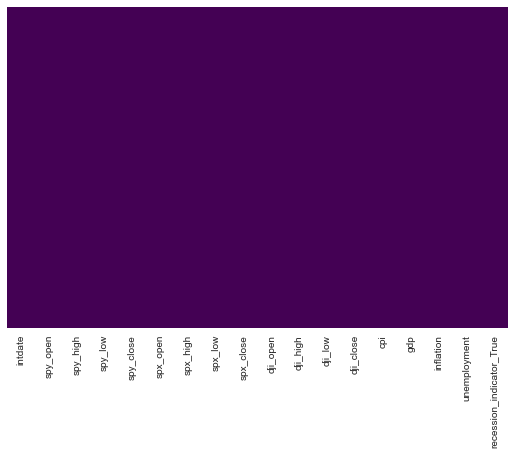

In [24]:
import seaborn as sns
sns.heatmap(data_df.isnull(),cbar=False,yticklabels=False,cmap = 'viridis')

## Checking Correlation

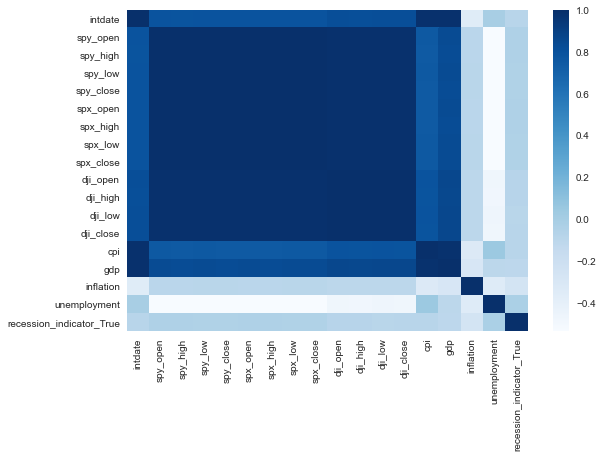

In [30]:
from matplotlib import figure
plt.figure.Figure(figsize=(6,4))
sns.heatmap(data_df.corr(),cmap='Blues',annot=False)

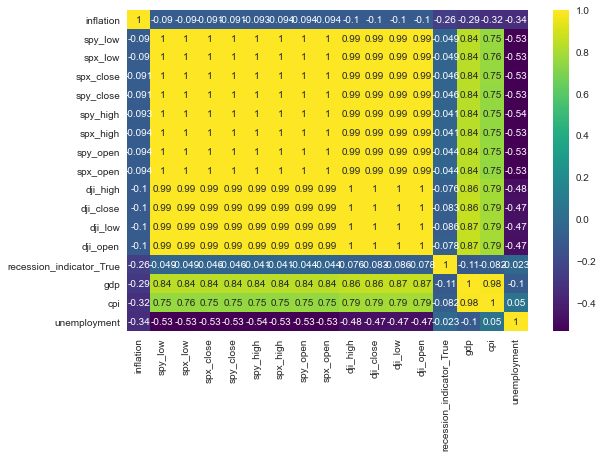

In [40]:
#Quality correlation matrix
k = 17# number of variables for heatmap
cols = data_df.corr().nlargest(k, 'inflation')['inflation'].index
cm = data_df[cols].corr()
plt.figure.Figure(figsize=(20,20))
sns.heatmap(cm, annot=True, cmap = 'viridis')

## Checking for outliers

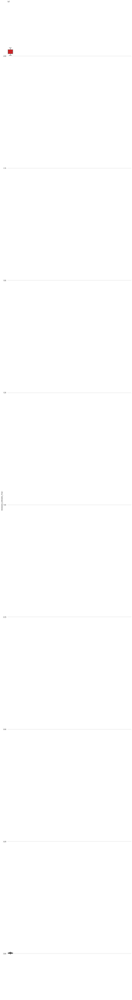

In [50]:
import matplotlib.pyplot as plt

l = data_df.columns.values
number_of_columns=12
number_of_rows = len(l)-1/number_of_columns
plt.figure(figsize=(number_of_columns,5*number_of_rows))
for i in range(0,len(l)):
    plt.plot(number_of_rows + 1,number_of_columns,i+1)
    sns.set_style('whitegrid')
    sns.boxplot(data_df[l[i]],color='red',orient='v')
    plt.tight_layout()

## Checking skewness

In [ ]:
plt.figure(figsize=(2*number_of_columns,5*number_of_rows))
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    sns.distplot({INSERT OUR DF HERE}[l[i]],kde=True) 